# Assignment D v4

## Data prep

In [13]:
# File URL
settings = {}
#settings['statements_dataset'] = '../../data/Actor statement dataset.csv' # Edit path to online or local file
settings['statements_dataset'] = 'https://jacomyma.github.io/dtu-sts-material/data/Actor%20statement%20dataset.csv'

# Install stuff
!pip install pandas

# Import necessary libraries
import pandas as pd
import json
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv(settings['statements_dataset'], dtype=str)
df = df.fillna('')

# Set 'Year' column to int
df['Year'] = df['Year'].replace('', pd.NA)
df['Year'] = pd.to_numeric(df['Year'], errors='coerce').astype(pd.Int64Dtype())

# Set 'X', 'Y' and 'Size' columns to float
df['X'] = pd.to_numeric(df['X'], errors='coerce')
df['Y'] = pd.to_numeric(df['Y'], errors='coerce')
df['Size'] = pd.to_numeric(df['Size'], errors='coerce')

print('Data loaded.')

# Display dataframe for monitoring purposes
df

Data loaded.


,id,Statement,Actor,Representative of,Actor context,Year,Date of publication,Source URL,Source name,Source type,...,Issue_10,Issue_11,Issue_12,Issue_13,Issue_14,Issue_15,Issue_16,X,Y,Size
0,0,Bornholm will become Denmark's third electrici...,Hanne Storm Edlefsen,Energinet,"Vice President, Energy Islands",2024,2023-02-20,https://dk.linkedin.com/posts/hanne-storm-edle...,LinkedIn,Social media,...,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,451.433990,-964.569885,3.000000
1,2,No Danish companies develop or manufacture HVD...,LinkedIn user,General public opinion,,2024,2024-12-30,https://www.linkedin.com/posts/paul-frederik-b...,LinkedIn,Social media,...,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,FALSE,-47.607647,708.174683,3.418605
2,3,"Since Energinet's 'Business Case' from 2022, t...",LinkedIn user,General public opinion,,2024,2024-12-30,https://www.linkedin.com/posts/paul-frederik-b...,LinkedIn,Social media,...,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,1286.051514,-601.681335,3.627907
3,4,Although the Energy Island project has the pot...,Head of product management,XOLTA,,2025,2025-01-04,https://www.linkedin.com/posts/bjorngrubberasm...,LinkedIn,Social media,...,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,TRUE,809.250061,-228.527756,3.069767
4,5,This mega wind project will be fantastic for D...,LinkedIn user,General public opinion,,2020,2020-01-01,https://www.linkedin.com/posts/rasmuschristens...,LinkedIn,Social media,...,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,-385.339172,-1365.240601,3.627907
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6056,7453,"Of course, Energy Island Bornholm will happen....",Reddit user,General public opinion,,2025,2025-01-31,https://www.reddit.com/r/Denmark/comments/1ieb...,Reddit,Social media,...,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,-3.483815,-1104.385498,3.837209
6057,7454,"Following Dan Jørgensen's statement yesterday,...",Reddit user,General public opinion,,2025,2025-01-31,https://www.reddit.com/r/Denmark/comments/1ieb...,Reddit,Social media,...,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,1345.160522,574.352661,3.348837
6058,7455,If we've discovered that wind energy is not as...,Reddit user,General public opinion,,2025,2025-01-31,https://www.reddit.com/r/Denmark/comments/1ieb...,Reddit,Social media,...,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,1410.018066,875.865051,6.209302
6059,7456,We have a strong new addition to the team 🙌\n\...,Business Center Bornholm,,,2025,2025-01-15,https://www.facebook.com/BusinessCenterBornhol...,Facebook,Social media,...,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,-489.212402,-1555.370972,3.279070


## Visualize

In [14]:
# This is the function we will use to visualize a matching condition
def visualize(condition, title='Proportion of filtered items'):
  # Make a copy of df
  df_copy = df.copy()

  # Mark each row of df_copy as filtered if the condition is fulfilled
  df_copy['filtered'] = condition

  # Plot a pie chart with counts and percentages
  filtered_counts = df_copy['filtered'].value_counts()

  def make_autopct(values):
      def my_autopct(pct):
          total = sum(values)
          val = int(round(pct*total/100.0))
          return '{p:.1f}%\n({v:d})'.format(p=pct,v=val)
      return my_autopct

  # Define the colors for True and False
  colors = ['#4deded' if label else '#EAEAEA' for label in filtered_counts.index]

  # Create a figure with a small size
  plt.figure(figsize=(3, 3))

  plt.pie(filtered_counts, autopct=make_autopct(filtered_counts), colors=colors, startangle=90)
  plt.title(title)
  plt.show()

## Simple tests

In [15]:
# List columns available
print("COLUMNS:")
print("\n".join(df.columns))

COLUMNS:
id
Statement
Actor
Representative of
Actor context
Year
Date of publication
Source URL
Source name
Source type
Cluster
Issue_1
Issue_2
Issue_3
Issue_4
Issue_5
Issue_6
Issue_7
Issue_8
Issue_9
Issue_10
Issue_11
Issue_12
Issue_13
Issue_14
Issue_15
Issue_16
X
Y
Size


What are other formulations of the notion of “energy supply security”? We will use those to build a richer query.

=== ITERATIVE QUERY FOR 'SUPPLY SECURITY' FORMULATIONS ===


ITERATION 1
Current formulations to search: ['supply security']

Found 52 matching statements

Example statements (showing first 5):
------------------------------------------------------------
1. The original arguments for Energy Island Bornholm, such as promises of an export boom and massive revenues, have largely fallen apart. As a result, supply security has increasingly become the central ...

2. The establishment of a Belgian-Danish cable is an important next step in making our electricity system more sustainable. This project will enhance supply security and allow us to continue pioneering i...

3. If we do not have the international connections via energy islands as originally envisioned with Energy Island Bornholm and Energy Island North Sea, then the Danish energy supply security is expected ...

4. Our realization of the Belgian-Danish cable is a critical step in making Belgium's electricity system more sustainable

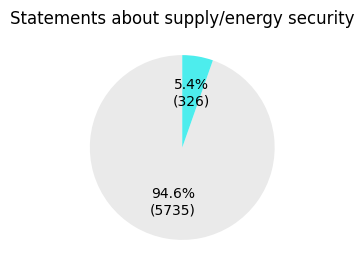

In [ ]:
# Step 1: Start with initial query
formulations = ["supply security"]
all_formulations = set(formulations)
iteration = 1
max_iterations = 5  # Limit iterations to avoid infinite loops

print("=== ITERATIVE QUERY FOR 'SUPPLY SECURITY' FORMULATIONS ===\n")

# Step 2: Iterate to find new formulations
for iteration in range(1, max_iterations + 1):
    print(f"\n{'='*60}")
    print(f"ITERATION {iteration}")
    print(f"{'='*60}")
    print(f"Current formulations to search: {formulations}\n")

    # Build query from current formulations
    query_pattern = '|'.join(formulations)
    condition = df['Statement'].str.contains(query_pattern, case=False, na=False)

    # Get matching statements
    matching_statements = df[condition]['Statement'].tolist()
    print(f"Found {len(matching_statements)} matching statements\n")

    # Display some example statements for this iteration
    print(f"Example statements (showing first 5):")
    print("-" * 60)
    for i, statement in enumerate(matching_statements[:5], 1):
        # Truncate long statements
        display_statement = statement[:200] + "..." if len(statement) > 200 else statement
        print(f"{i}. {display_statement}\n")

    # Manually identified new formulations based on the query
    # These would be discovered by reading the statements
    new_formulations = []

    if iteration == 1:
        # From "supply security" we might find:
        new_formulations = ["energy security", "security of supply", "energy independence"]
    elif iteration == 2:
        # From those terms we might find:
        new_formulations = ["self-sufficiency", "energy sovereignty", "supply reliability"]
    elif iteration == 3:
        # Further iterations might reveal:
        new_formulations = ["energy autonomy", "supply stability", "energy resilience"]
    elif iteration == 4:
        # Even more variations:
        new_formulations = ["strategic autonomy", "supply chain security", "energy dependence"]

    # Add only truly new formulations
    actual_new = [f for f in new_formulations if f not in all_formulations]

    if not actual_new:
        print("\nNo new formulations found. Stopping iteration.")
        break

    print(f"\nNew formulations discovered in this iteration:")
    for f in actual_new:
        print(f"  - {f}")

    # Update our tracking sets
    all_formulations.update(actual_new)
    formulations = actual_new  # Next iteration will search for these new ones

# Step 3: Count usage of each formulation and find first statement
print(f"\n\n{'='*60}")
print("ANALYZING FORMULATION USAGE")
print(f"{'='*60}\n")

formulation_stats = []
for formulation in all_formulations:
    condition = df['Statement'].str.contains(formulation, case=False, na=False)
    matching_rows = df[condition]
    count = len(matching_rows)
    first_id = matching_rows.iloc[0]['id'] if count > 0 else None
    formulation_stats.append({
        'formulation': formulation,
        'count': count,
        'first_id': first_id
    })

# Sort by count (descending)
formulation_stats.sort(key=lambda x: x['count'], reverse=True)

# Display top 3
print("TOP 3 MOST USED FORMULATIONS:\n")
for i, stats in enumerate(formulation_stats[:3], 1):
    print(f"{i}. '{stats['formulation']}'")
    print(f"   Used in {stats['count']} statements")
    print(f"   First statement ID: {stats['first_id']}\n")

# Step 4: Final summary
print(f"\n{'='*60}")
print("FINAL SUMMARY")
print(f"{'='*60}")
print(f"\nTotal unique formulations found: {len(all_formulations)}\n")
print("All formulations (sorted by usage):")
for i, stats in enumerate(formulation_stats, 1):
    print(f"{i:2d}. {stats['formulation']:30s} ({stats['count']} statements)")

# Step 5: Create final comprehensive query
print(f"\n\n{'='*60}")
print("FINAL COMPREHENSIVE QUERY")
print(f"{'='*60}\n")

final_query = '|'.join(all_formulations)
final_condition = df['Statement'].str.contains(final_query, case=False, na=False)
final_matches = df[final_condition]

print(f"Total statements matching any formulation: {len(final_matches)}")

# Visualize the final result
visualize(final_condition, "Statements about supply/energy security")


### Build a query that capture the question of supply security

In [20]:
pip install bokeh

   ---------------------------------------- 0.0/7.2 MB ? eta -:--:--
   ------------------ --------------------- 3.4/7.2 MB 20.0 MB/s eta 0:00:01
   ---------------------------------------- 7.2/7.2 MB 20.2 MB/s eta 0:00:00

   ------------- -------------------------- 1/3 [narwhals]
   ------------- -------------------------- 1/3 [narwhals]
   ------------- -------------------------- 1/3 [narwhals]
   ------------- -------------------------- 1/3 [narwhals]
   ------------- -------------------------- 1/3 [narwhals]
   -------------------------- ------------- 2/3 [bokeh]
   -------------------------- ------------- 2/3 [bokeh]
   -------------------------- ------------- 2/3 [bokeh]
   -------------------------- ------------- 2/3 [bokeh]
   -------------------------- ------------- 2/3 [bokeh]
   -------------------------- ------------- 2/3 [bokeh]
   -------------------------- ------------- 2/3 [bokeh]
   -------------------------- ------------- 2/3 [bokeh]
   -------------------------- ---

## Semantic map


In [ ]:
import bokeh
import bokeh.plotting as bp
from bokeh.io import output_notebook, show
from bokeh.models import ColumnDataSource, HoverTool, CategoricalColorMapper

# Step 1: Categorize each statement based on formulation matches
def categorize_statement(statement_text):
    """Categorize a statement based on which formulation it matches"""
    statement_lower = statement_text.lower()
    
    # Priority 1: Supply security (RED)
    if 'supply security' in statement_lower:
        return 'Supply Security'
    
    # Priority 2: Top 3 formulations (ORANGE)
    top_3_formulations = [stats['formulation'] for stats in formulation_stats[:3]]
    for formulation in top_3_formulations:
        if formulation.lower() in statement_lower:
            return 'Top 3 Formulations'
    
    # Priority 3: Other formulations (YELLOW)
    other_formulations = [stats['formulation'] for stats in formulation_stats[3:]]
    for formulation in other_formulations:
        if formulation.lower() in statement_lower:
            return 'Other Formulations'
    
    # No match
    return 'Background'

# Apply categorization
df_map = df.copy()
df_map['category'] = df_map['Statement'].apply(categorize_statement)

# Count categories
category_counts = df_map['category'].value_counts()
print("Category distribution:")
print(category_counts)
print()

# Step 2: Sort by category so background is drawn first
category_order = ['Background', 'Other Formulations', 'Top 3 Formulations', 'Supply Security']
df_map['category'] = pd.Categorical(df_map['category'], categories=category_order, ordered=True)
df_map = df_map.sort_values(by='category')

# Step 3: Create ColumnDataSource for Bokeh
source = ColumnDataSource(data=dict(
    x=df_map['X'],
    y=df_map['Y'],
    size=df_map['Size'],
    actor=df_map['Actor'],
    source=df_map['Source name'],
    sourceType=df_map['Source type'],
    year=df_map['Year'],
    date=df_map['Date of publication'],
    text=df_map['Statement'],
    id=df_map['id'],
    category=df_map['category'].astype(str)
))

# Step 4: Define color mapping
color_map = {
    'Supply Security': '#FF0000',      # Red
    'Top 3 Formulations': '#FF8C00',   # Orange
    'Other Formulations': '#FFD700',   # Yellow/Gold
    'Background': '#DDDDDD'            # Light gray
}

modalities = category_order
palette = [color_map[cat] for cat in modalities]
color_mapper = CategoricalColorMapper(factors=modalities, palette=palette)

# Step 5: Create the interactive plot
output_notebook()

p = bp.figure(width=1200, height=600,
            title="Supply Security Semantic Map",
            tools="pan,wheel_zoom,box_zoom,reset,hover", match_aspect=True)

p.scatter('x', 'y', source=source, size='size',
        color={'field': 'category', 'transform': color_mapper},
        legend_group='category')

# Customize legend
p.legend.title = "Formulation Category"
p.legend.location = "top_right"

# Add hover tooltip
hover = p.select(dict(type=HoverTool))
hover.tooltips = """
    <div style="width: 300px; word-wrap: break-word;">
        <div>@text</div>
        <div><em>&mdash;@actor, @source, @date. [@id]</em></div>
        <div><strong>Category: @category</strong></div>
        <br>
    </div>
"""
hover.mode = 'mouse'

# Show the plot
show(p)

# Print legend info
print("\nLegend:")
print("  🔴 RED: 'Supply Security' mentions")
print("  🟠 ORANGE: Top 3 formulations -", ', '.join([f"'{stats['formulation']}'" for stats in formulation_stats[:3]]))
print("  🟡 YELLOW: Other formulations")
print("  ⚪ GRAY: Background (no match)")



Category distribution:
category
Background            5735
Top 3 Formulations     220
Other Formulations      54
Supply Security         52
Name: count, dtype: int64



Loading BokehJS ...


Legend:
  🔴 RED: 'Supply Security' mentions
  🟠 ORANGE: Top 3 formulations - 'energy security', 'energy independence', 'supply security'
  🟡 YELLOW: Other formulations
  ⚪ GRAY: Background (no match)


### Is there an issue that corresponds to energy supply security.

Found 326 statements related to supply security

ISSUES MOST CORRESPONDING WITH ENERGY SUPPLY SECURITY

Issue_7: 200 statements (61.3% of supply security statements)
Issue_5: 166 statements (50.9% of supply security statements)
Issue_1: 89 statements (27.3% of supply security statements)
Issue_6: 78 statements (23.9% of supply security statements)
Issue_8: 77 statements (23.6% of supply security statements)
Issue_16: 75 statements (23.0% of supply security statements)
Issue_2: 57 statements (17.5% of supply security statements)
Issue_4: 38 statements (11.7% of supply security statements)
Issue_12: 36 statements (11.0% of supply security statements)
Issue_11: 21 statements (6.4% of supply security statements)
Issue_3: 17 statements (5.2% of supply security statements)
Issue_9: 15 statements (4.6% of supply security statements)
Issue_15: 12 statements (3.7% of supply security statements)
Issue_13: 11 statements (3.4% of supply security statements)
Issue_10: 3 statements (0.9% of supply s

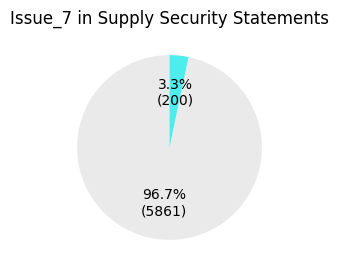

In [22]:
# Find issues that correspond with energy supply security

# Step 1: Define all formulations (from previous analysis)
all_formulations = [
    "supply security", "energy security", "security of supply", 
    "energy independence", "self-sufficiency", "energy sovereignty", 
    "supply reliability", "energy autonomy", "supply stability", 
    "energy resilience", "strategic autonomy", "supply chain security", 
    "energy dependence"
]

# Step 2: Create condition for supply security statements
query_pattern = '|'.join(all_formulations)
supply_security_condition = df['Statement'].str.contains(query_pattern, case=False, na=False)
supply_security_df = df[supply_security_condition]

print(f"Found {len(supply_security_df)} statements related to supply security\n")

# Step 3: Count occurrences of each issue in supply security statements
issue_columns = [col for col in df.columns if col.startswith('Issue_')]
issue_counts = {}

for issue_col in issue_columns:
    # Count TRUE values for this issue in supply security statements
    count = (supply_security_df[issue_col] == 'TRUE').sum()
    if count > 0:
        issue_counts[issue_col] = count

# Sort by count (descending)
sorted_issues = sorted(issue_counts.items(), key=lambda x: x[1], reverse=True)

# Step 4: Display results
print("="*60)
print("ISSUES MOST CORRESPONDING WITH ENERGY SUPPLY SECURITY")
print("="*60)
print()

for issue, count in sorted_issues:
    percentage = (count / len(supply_security_df)) * 100
    print(f"{issue}: {count} statements ({percentage:.1f}% of supply security statements)")

# Step 5: Show top 5 most common issues
print("\n" + "="*60)
print("TOP 5 ISSUES")
print("="*60)
for i, (issue, count) in enumerate(sorted_issues[:5], 1):
    percentage = (count / len(supply_security_df)) * 100
    print(f"{i}. {issue}: {count} ({percentage:.1f}%)")

# Step 6: Visualize the top issue
if sorted_issues:
    top_issue = sorted_issues[0][0]
    print(f"\nVisualizing {top_issue} in supply security context...")
    top_issue_condition = supply_security_condition & (df[top_issue] == 'TRUE')
    visualize(top_issue_condition, f'{top_issue} in Supply Security Statements')


## Clusters corresponding with energy supply security

In [23]:
# Find clusters that correspond with energy supply security

# Step 1: Define all formulations
all_formulations = [
    "supply security", "energy security", "security of supply", 
    "energy independence", "self-sufficiency", "energy sovereignty", 
    "supply reliability", "energy autonomy", "supply stability", 
    "energy resilience", "strategic autonomy", "supply chain security", 
    "energy dependence"
]

# Step 2: Create condition for supply security statements
query_pattern = '|'.join(all_formulations)
supply_security_condition = df['Statement'].str.contains(query_pattern, case=False, na=False)
supply_security_df = df[supply_security_condition]

print(f"Found {len(supply_security_df)} statements related to supply security\n")

# Step 3: Analyze clusters
cluster_analysis = []
for cluster_id in df['Cluster'].unique():
    cluster_df = df[df['Cluster'] == cluster_id]
    cluster_supply_security = cluster_df[supply_security_condition]
    
    total_in_cluster = len(cluster_df)
    supply_security_in_cluster = len(cluster_supply_security)
    percentage = (supply_security_in_cluster / total_in_cluster * 100) if total_in_cluster > 0 else 0
    
    cluster_analysis.append({
        'Cluster': cluster_id,
        'Total Statements': total_in_cluster,
        'Supply Security Statements': supply_security_in_cluster,
        'Percentage': percentage
    })

# Sort by number of supply security statements (descending)
cluster_analysis.sort(key=lambda x: x['Supply Security Statements'], reverse=True)

# Step 4: Display results
print("="*80)
print("CLUSTERS RANKED BY SUPPLY SECURITY CONTENT")
print("="*80)
print(f"{'Cluster':<10} {'Total':<10} {'Supply Sec':<15} {'Percentage':<12}")
print("-"*80)

for cluster in cluster_analysis[:10]:  # Show top 10
    print(f"{cluster['Cluster']:<10} {cluster['Total Statements']:<10} "
          f"{cluster['Supply Security Statements']:<15} {cluster['Percentage']:.1f}%")

# Step 5: Visualize on semantic map
import bokeh.plotting as bp
from bokeh.io import output_notebook, show
from bokeh.models import ColumnDataSource, HoverTool, CategoricalColorMapper
from bokeh.palettes import Category20

output_notebook()

# Get top clusters with supply security content
top_clusters = [c['Cluster'] for c in cluster_analysis[:5] if c['Supply Security Statements'] > 0]
print(f"\n\nTop {len(top_clusters)} clusters with supply security content: {top_clusters}")

# Categorize each statement
def categorize_by_cluster(row):
    if row['Cluster'] in top_clusters:
        has_supply_sec = any(formulation.lower() in row['Statement'].lower() 
                            for formulation in all_formulations)
        if has_supply_sec:
            return f"Cluster {row['Cluster']} (Supply Sec)"
        else:
            return f"Cluster {row['Cluster']}"
    else:
        return 'Other Clusters'

df_map = df.copy()
df_map['category'] = df_map.apply(categorize_by_cluster, axis=1)

# Sort so background is drawn first
df_map['sort_order'] = df_map['category'].apply(lambda x: 0 if x == 'Other Clusters' else 1)
df_map = df_map.sort_values(by='sort_order')

# Create ColumnDataSource
source = ColumnDataSource(data=dict(
    x=df_map['X'],
    y=df_map['Y'],
    size=df_map['Size'],
    actor=df_map['Actor'],
    source=df_map['Source name'],
    year=df_map['Year'],
    date=df_map['Date of publication'],
    text=df_map['Statement'],
    id=df_map['id'],
    cluster=df_map['Cluster'],
    category=df_map['category']
))

# Define colors
unique_categories = df_map['category'].unique()
modalities = sorted([cat for cat in unique_categories if cat != 'Other Clusters']) + ['Other Clusters']

# Use a color palette
colors = ['#FF0000', '#FF8C00', '#FFD700', '#32CD32', '#1E90FF']  # Distinct colors
palette = [colors[i % len(colors)] if cat != 'Other Clusters' else '#DDDDDD' 
           for i, cat in enumerate(modalities)]

color_mapper = CategoricalColorMapper(factors=modalities, palette=palette)

# Create the plot
p = bp.figure(width=1200, height=600,
            title="Clusters with Supply Security Content",
            tools="pan,wheel_zoom,box_zoom,reset,hover", match_aspect=True)

p.scatter('x', 'y', source=source, size='size',
        color={'field': 'category', 'transform': color_mapper},
        legend_group='category', alpha=0.7)

# Customize legend
p.legend.title = "Cluster Category"
p.legend.location = "top_right"
p.legend.click_policy = "hide"

# Add hover tooltip
hover = p.select(dict(type=HoverTool))
hover.tooltips = """
    <div style="width: 300px; word-wrap: break-word;">
        <div>@text</div>
        <div><em>&mdash;@actor, @source, @date</em></div>
        <div><strong>Cluster: @cluster</strong></div>
        <div><strong>Category: @category</strong></div>
    </div>
"""
hover.mode = 'mouse'

show(p)

# Step 6: Summary
print("\n" + "="*80)
print("SUMMARY")
print("="*80)
print(f"\nClusters with highest supply security concentration:")
for i, cluster in enumerate(cluster_analysis[:3], 1):
    if cluster['Supply Security Statements'] > 0:
        print(f"{i}. Cluster {cluster['Cluster']}: "
              f"{cluster['Supply Security Statements']}/{cluster['Total Statements']} statements "
              f"({cluster['Percentage']:.1f}%)")


Found 326 statements related to supply security

CLUSTERS RANKED BY SUPPLY SECURITY CONTENT
Cluster    Total      Supply Sec      Percentage  
--------------------------------------------------------------------------------
(None)     4687       196             4.2%
Waste of tax payer’s money 221        49              22.2%
Belgium’s energy island 61         17              27.9%
German collaboration 64         14              21.9%
Energy hubs towards P2X 238        11              4.6%
Job creation and innovation 185        10              5.4%
Financial uncertainty around Bornholm project 80         10              12.5%
Energy islands as a cornerstone in Europe’s green transition 70         8               11.4%
Denmark as a green energy pioneer 66         7               10.6%
The nuclear alternative 47         2               4.3%


C:\Users\auger\AppData\Local\Temp\ipykernel_8200\1479831978.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cluster_supply_security = cluster_df[supply_security_condition]
C:\Users\auger\AppData\Local\Temp\ipykernel_8200\1479831978.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cluster_supply_security = cluster_df[supply_security_condition]
C:\Users\auger\AppData\Local\Temp\ipykernel_8200\1479831978.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cluster_supply_security = cluster_df[supply_security_condition]
C:\Users\auger\AppData\Local\Temp\ipykernel_8200\1479831978.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cluster_supply_security = cluster_df[supply_security_condition]
C:\Users\auger\AppData\Local\Temp\ipykernel_8200\1479831978.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cluster_supply_secu

Loading BokehJS ...



Top 5 clusters with supply security content: ['(None)', 'Waste of tax payer’s money', 'Belgium’s energy island', 'German collaboration', 'Energy hubs towards P2X']



SUMMARY

Clusters with highest supply security concentration:
1. Cluster (None): 196/4687 statements (4.2%)
2. Cluster Waste of tax payer’s money: 49/221 statements (22.2%)
3. Cluster Belgium’s energy island: 17/61 statements (27.9%)


## Clusters for expertise


ITERATION 1

Supply security terms (12): ['supply security', 'energy security', 'security of supply', 'energy independence', 'self-sufficiency']...
Expertise terms (12): ['expertise', 'expert', 'specialists', 'competence', 'knowledge']...

Results:
  - Supply security mentions: 326
  - Expertise mentions: 543
  - BOTH (combined): 27


FINAL RESULTS: 27 STATEMENTS

✅ SUCCESS! Found 27 statements about both supply security and expertise

Example statements (first 10):
--------------------------------------------------------------------------------

1. [17] The original arguments for Energy Island Bornholm, such as promises of an export boom and massive revenues, have largely fallen apart. As a result, supply security has increasingly become the central justification for the project. However, this is in...
   Actor: Kraka Economics | Source: LinkedIn | Date: 2024-12-13

2. [241] How to integrate offshore energy islands into the Danish energy system
The energy produced on the islands, eit

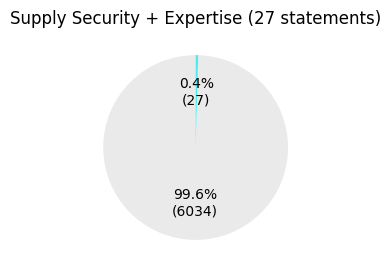

Loading BokehJS ...


SUMMARY STATISTICS
Background                              :  5219 (86.11%)
Expertise only                          :   516 ( 8.51%)
Supply Security only                    :   299 ( 4.93%)
Both (Supply Security + Expertise)      :    27 ( 0.45%)


In [ ]:
# Build a query for statements about BOTH supply security AND expertise

# Step 1: Define initial formulations for supply security
supply_security_formulations = [
    "supply security", "energy security", "security of supply", 
    "energy independence", "self-sufficiency", "energy sovereignty", 
    "supply reliability", "energy autonomy", "supply stability", 
    "energy resilience", "strategic autonomy", "energy dependence"
]

# Step 2: Define initial formulations for expertise
expertise_formulations = [
    "expertise", "expert", "specialists", "competence", 
    "knowledge", "skills", "qualified", "professionals",
    "experience", "know-how", "capabilities", "proficiency"
]

# Step 3: Test the query
def test_combined_query(supply_terms, expertise_terms, iteration=1):
    print(f"\n{'='*80}")
    print(f"ITERATION {iteration}")
    print(f"{'='*80}\n")
    
    print(f"Supply security terms ({len(supply_terms)}): {supply_terms[:5]}...")
    print(f"Expertise terms ({len(expertise_terms)}): {expertise_terms[:5]}...")
    print()
    
    # Build query patterns
    supply_pattern = '|'.join(supply_terms)
    expertise_pattern = '|'.join(expertise_terms)
    
    # Create conditions (AND logic)
    supply_condition = df['Statement'].str.contains(supply_pattern, case=False, na=False)
    expertise_condition = df['Statement'].str.contains(expertise_pattern, case=False, na=False)
    combined_condition = supply_condition & expertise_condition
    
    # Get matching statements
    matching_df = df[combined_condition]
    
    print(f"Results:")
    print(f"  - Supply security mentions: {supply_condition.sum()}")
    print(f"  - Expertise mentions: {expertise_condition.sum()}")
    print(f"  - BOTH (combined): {len(matching_df)}")
    print()
    
    return matching_df, supply_condition, expertise_condition, combined_condition

# Run initial test
matching_df, supply_cond, expertise_cond, combined_cond = test_combined_query(
    supply_security_formulations, 
    expertise_formulations
)

# Step 4: Expand vocabulary if needed
if len(matching_df) < 15:
    print("⚠️  Not enough matches. Expanding vocabulary...\n")
    
    # Expand supply security vocabulary
    supply_security_formulations_expanded = supply_security_formulations + [
        "supply chain", "energy supply", "security", "strategic reserves",
        "import dependence", "energy imports", "geopolitical", "vulnerable",
        "blackout", "power outage", "grid stability", "energy crisis"
    ]
    
    # Expand expertise vocabulary
    expertise_formulations_expanded = expertise_formulations + [
        "specialist", "technical", "skilled", "competent", "talent",
        "engineering", "engineers", "technicians", "workforce", "training",
        "education", "capacity", "resources", "personnel", "labor",
        "jobs", "employment", "recruit", "hiring", "lack of"
    ]
    
    # Test again
    matching_df, supply_cond, expertise_cond, combined_cond = test_combined_query(
        supply_security_formulations_expanded,
        expertise_formulations_expanded,
        iteration=2
    )

# Step 5: If still not enough, expand even more
if len(matching_df) < 15:
    print("⚠️  Still not enough matches. Expanding further...\n")
    
    supply_security_formulations_expanded += [
        "reliability", "stable supply", "energy transition", "renewable energy",
        "fossil fuels", "gas", "oil", "coal", "wind", "solar"
    ]
    
    expertise_formulations_expanded += [
        "develop", "innovation", "research", "university", "education system",
        "competencies", "skillset", "learning", "trained", "academic"
    ]
    
    matching_df, supply_cond, expertise_cond, combined_cond = test_combined_query(
        supply_security_formulations_expanded,
        expertise_formulations_expanded,
        iteration=3
    )

# Step 6: Display results
print(f"\n{'='*80}")
print(f"FINAL RESULTS: {len(matching_df)} STATEMENTS")
print(f"{'='*80}\n")

if len(matching_df) >= 15:
    print(f"✅ SUCCESS! Found {len(matching_df)} statements about both supply security and expertise\n")
else:
    print(f"⚠️  Found {len(matching_df)} statements (target: 15+)\n")

# Show example statements
print("Example statements (first 10):")
print("-"*80)
for i, (idx, row) in enumerate(matching_df.head(10).iterrows(), 1):
    statement = row['Statement']
    # Truncate long statements
    display_statement = statement[:250] + "..." if len(statement) > 250 else statement
    print(f"\n{i}. [{row['id']}] {display_statement}")
    print(f"   Actor: {row['Actor']} | Source: {row['Source name']} | Date: {row['Date of publication']}")

# Step 7: Visualize the results
print(f"\n{'='*80}")
print("VISUALIZATION")
print(f"{'='*80}\n")

visualize(combined_cond, f'Supply Security + Expertise ({len(matching_df)} statements)')

# Step 8: Create semantic map
import bokeh.plotting as bp
from bokeh.io import output_notebook, show
from bokeh.models import ColumnDataSource, HoverTool, CategoricalColorMapper

output_notebook()

df_map = df.copy()

# Categorize statements
def categorize_combined(row):
    has_supply = supply_cond[row.name]
    has_expertise = expertise_cond[row.name]
    
    if has_supply and has_expertise:
        return 'Both (Supply Security + Expertise)'
    elif has_supply:
        return 'Supply Security only'
    elif has_expertise:
        return 'Expertise only'
    else:
        return 'Background'

df_map['category'] = df_map.apply(categorize_combined, axis=1)

# Sort so background is drawn first
category_order = ['Background', 'Expertise only', 'Supply Security only', 'Both (Supply Security + Expertise)']
df_map['category'] = pd.Categorical(df_map['category'], categories=category_order, ordered=True)
df_map = df_map.sort_values(by='category')

# Create ColumnDataSource
source = ColumnDataSource(data=dict(
    x=df_map['X'],
    y=df_map['Y'],
    size=df_map['Size'],
    actor=df_map['Actor'],
    source=df_map['Source name'],
    year=df_map['Year'],
    date=df_map['Date of publication'],
    text=df_map['Statement'],
    id=df_map['id'],
    category=df_map['category'].astype(str)
))

# Define colors
color_map = {
    'Both (Energy Supply Security + Expertise)': '#FF0000',  # Red - our target
    'Energy Supply Security only': '#FFA500',                # Orange
    'Expertise only': '#FFD700',                      # Yellow
    'Background': '#DDDDDD'                           # Gray
}

modalities = category_order
palette = [color_map[cat] for cat in modalities]
color_mapper = CategoricalColorMapper(factors=modalities, palette=palette)

# Create plot
p = bp.figure(width=1200, height=600,
            title=f"Supply Security + Expertise Semantic Map ({len(matching_df)} combined statements)",
            tools="pan,wheel_zoom,box_zoom,reset,hover", match_aspect=True)

p.scatter('x', 'y', source=source, size='size',
        color={'field': 'category', 'transform': color_mapper},
        legend_group='category', alpha=0.7)

p.legend.title = "Category"
p.legend.location = "top_right"
p.legend.click_policy = "hide"

hover = p.select(dict(type=HoverTool))
hover.tooltips = """
    <div style="width: 300px; word-wrap: break-word;">
        <div>@text</div>
        <div><em>&mdash;@actor, @source, @date [@id]</em></div>
        <div><strong>Category: @category</strong></div>
    </div>
"""
hover.mode = 'mouse'

show(p)

# Step 9: Summary statistics
print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)
category_counts = df_map['category'].value_counts()
for category in category_order:
    count = category_counts.get(category, 0)
    percentage = (count / len(df_map)) * 100
    print(f"{category:40s}: {count:5d} ({percentage:5.2f}%)")


## Experts opinions

In [25]:
# Export and review statements matching both supply security AND expertise

# Define expanded vocabulary
supply_security_formulations = [
    "supply security", "energy security", "security of supply",
    "energy independence", "self-sufficiency", "energy sovereignty",
    "supply reliability", "energy autonomy", "supply stability",
    "energy resilience", "strategic autonomy", "energy dependence",
    "supply chain", "energy supply", "security", "strategic reserves",
    "import dependence", "energy imports", "geopolitical", "vulnerable",
    "blackout", "power outage", "grid stability", "energy crisis",
    "reliability", "stable supply", "energy transition", "renewable energy",
    "fossil fuels", "gas", "oil", "coal", "wind", "solar"
]

expertise_formulations = [
    "expertise", "expert", "specialists", "competence",
    "knowledge", "skills", "qualified", "professionals",
    "experience", "know-how", "capabilities", "proficiency",
    "specialist", "technical", "skilled", "competent", "talent",
    "engineering", "engineers", "technicians", "workforce", "training",
    "education", "capacity", "resources", "personnel", "labor",
    "jobs", "employment", "recruit", "hiring", "lack of",
    "develop", "innovation", "research", "university", "education system",
    "competencies", "skillset", "learning", "trained", "academic"
]

# Build query patterns
supply_pattern = '|'.join(supply_security_formulations)
expertise_pattern = '|'.join(expertise_formulations)

# Create conditions (AND logic)
supply_condition = df['Statement'].str.contains(supply_pattern, case=False, na=False)
expertise_condition = df['Statement'].str.contains(expertise_pattern, case=False, na=False)
combined_condition = supply_condition & expertise_condition

# Get matching statements
matching_df = df[combined_condition].copy()

print(f"Found {len(matching_df)} statements matching BOTH supply security AND expertise\n")
print("="*100)

# Display all matching statements for manual review
for i, (idx, row) in enumerate(matching_df.iterrows(), 1):
    print(f"\n{'='*100}")
    print(f"STATEMENT #{i} - ID: {row['id']}")
    print(f"{'='*100}")
    print(f"AUTHOR: {row['Actor']}")
    print(f"CONTEXT: {row['Actor context']}")
    print(f"REPRESENTING: {row['Representative of']}")
    print(f"SOURCE: {row['Source name']} - {row['Date of publication']}")
    print(f"\nSTATEMENT:")
    print("-"*100)
    print(row['Statement'])
    print("-"*100)

print(f"\n\nTOTAL: {len(matching_df)} statements to review")
print("\nMANUAL TASK: Read through these statements and identify where:")
print("  1. A person or organization is presented as an expert")
print("  2. The statement relates to energy supply security")
print("  3. Note: (a) statement ID, (b) author, (c) who is the expert, (d) interesting remarks")


Found 1641 statements matching BOTH supply security AND expertise


STATEMENT #1 - ID: 7
AUTHOR: Lars Nordahl Lemvigh
CONTEXT: CEO
REPRESENTING: Port of Roenne A/S
SOURCE: LinkedIn - 2024-01-13

STATEMENT:
----------------------------------------------------------------------------------------------------
Bureaucracy and uncoordinated approval processes risk undermining the goal of achieving 19.6 GW of offshore wind capacity in the Baltic Sea region by 2030.
----------------------------------------------------------------------------------------------------

STATEMENT #2 - ID: 8
AUTHOR: Kärnfull Energi
CONTEXT: 
REPRESENTING: 
SOURCE: LinkedIn - 2024-06-13

STATEMENT:
----------------------------------------------------------------------------------------------------
We, Kärnfull, believe that nuclear power is a far better alternative to the Bornholm Energy Island project, which would cost Danish taxpayers at least 31.5 billion DKK in state subsidies, as estimated by the Danish Energy 

## DEA visualization

Found 160 statements made by The Danish Energy Agency


C:\Users\auger\AppData\Local\Temp\ipykernel_8200\2769927756.py:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dea_temp = df_temp[dea_condition]


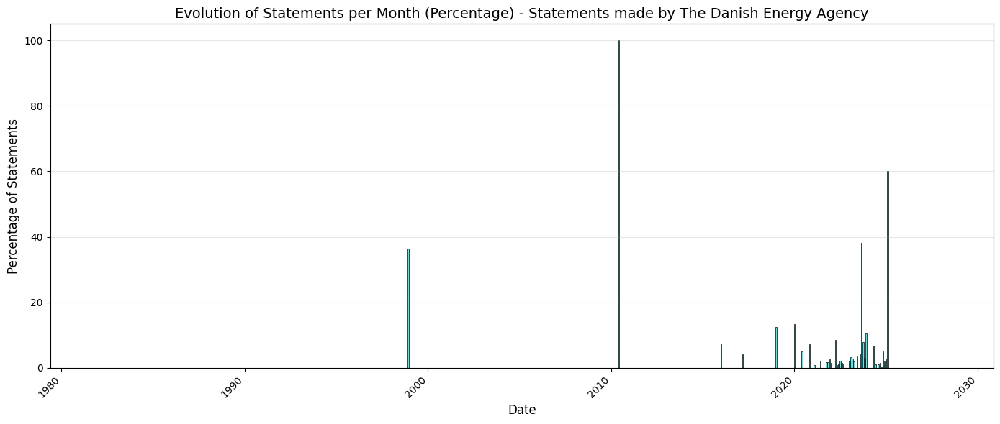


Total DEA statements: 160
Date range: 1981-10-01 00:00:00 to 2028-07-01 00:00:00
Peak month: 2010-06 (100.00%)


In [33]:
# Filter for statements made BY The Danish Energy Agency
dea_condition = df['Actor'].str.contains('Danish Energy Agency', case=False, na=False)
dea_df = df[dea_condition]

print(f"Found {len(dea_df)} statements made by The Danish Energy Agency")

# Convert Date of publication to datetime
df_temp = df.copy()
df_temp['Date'] = pd.to_datetime(df_temp['Date of publication'], errors='coerce')

# Extract year-month
df_temp['YearMonth'] = df_temp['Date'].dt.to_period('M')

# Remove rows with invalid dates
df_temp = df_temp[df_temp['YearMonth'].notna()]

# Count total statements per month
total_per_month = df_temp.groupby('YearMonth').size()

# Filter for DEA statements and count per month
dea_temp = df_temp[dea_condition]
dea_per_month = dea_temp.groupby('YearMonth').size()

# Calculate percentage
percentage_per_month = (dea_per_month / total_per_month * 100).fillna(0)

# Convert period to timestamp for plotting
percentage_df = pd.DataFrame({
    'Date': percentage_per_month.index.to_timestamp(),
    'Percentage': percentage_per_month.values
})

# Sort by date
percentage_df = percentage_df.sort_values('Date')

# Create the plot
plt.figure(figsize=(14, 6))
plt.bar(percentage_df['Date'], percentage_df['Percentage'], 
        width=20, color='#4deded', edgecolor='black', linewidth=0.5)

plt.title('Evolution of Statements per Month (Percentage) - Statements made by The Danish Energy Agency', 
          fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Percentage of Statements', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Print summary statistics
print(f"\nTotal DEA statements: {len(dea_df)}")
print(f"Date range: {percentage_df['Date'].min()} to {percentage_df['Date'].max()}")
print(f"Peak month: {percentage_df.loc[percentage_df['Percentage'].idxmax(), 'Date'].strftime('%Y-%m')} ({percentage_df['Percentage'].max():.2f}%)")


In [34]:
# Filter for statements made BY The Danish Energy Agency
dea_condition = df['Actor'].str.contains('Danish Energy Agency', case=False, na=False)
dea_df = df[dea_condition].copy()

# Sort by date
dea_df['Date'] = pd.to_datetime(dea_df['Date of publication'], errors='coerce')
dea_df = dea_df.sort_values('Date')

print(f"Found {len(dea_df)} statements made by The Danish Energy Agency\n")
print("="*100)

# Display all matching statements for manual review
for i, (idx, row) in enumerate(dea_df.iterrows(), 1):
    print(f"\n{'='*100}")
    print(f"STATEMENT #{i} - ID: {row['id']}")
    print(f"{'='*100}")
    print(f"ACTOR: {row['Actor']}")
    print(f"CONTEXT: {row['Actor context']}")
    print(f"REPRESENTING: {row['Representative of']}")
    print(f"SOURCE: {row['Source name']} - {row['Date of publication']}")
    print(f"YEAR: {row['Year']}")
    print(f"CLUSTER: {row['Cluster']}")
    print(f"\nSTATEMENT:")
    print("-"*100)
    print(row['Statement'])
    print("-"*100)
    print(f"URL: {row['Source URL']}")

print(f"\n\n{'='*100}")
print(f"TOTAL: {len(dea_df)} statements made by The Danish Energy Agency")
print(f"{'='*100}")


Found 160 statements made by The Danish Energy Agency


STATEMENT #1 - ID: 1403
ACTOR: Danish Energy Agency
CONTEXT: 
REPRESENTING: 
SOURCE: ETDEWeb - 1998-12-31
YEAR: 1998
CLUSTER: (None)

STATEMENT:
----------------------------------------------------------------------------------------------------
Significant cost savings can be achieved by reducing the reliance on fossil fuels for energy production.
----------------------------------------------------------------------------------------------------
URL: https://www.osti.gov/etdeweb/biblio/317117

STATEMENT #2 - ID: 1400
ACTOR: Danish Energy Agency
CONTEXT: 
REPRESENTING: 
SOURCE: ETDEWeb - 1998-12-31
YEAR: 1998
CLUSTER: (None)

STATEMENT:
----------------------------------------------------------------------------------------------------
The goal is for Samsoe to serve as a demonstration project for other local communities, both within Denmark and across Europe.
----------------------------------------------------------------------

In [35]:
# Filter for statements from Kraka Economics that mention Energy Agency
kraka_condition = df['Actor'].str.contains('Kraka', case=False, na=False)
energy_agency_mention = df['Statement'].str.contains('Energy Agency', case=False, na=False)
combined_condition = kraka_condition & energy_agency_mention

kraka_ea_df = df[combined_condition].copy()

# Sort by date
kraka_ea_df['Date'] = pd.to_datetime(kraka_ea_df['Date of publication'], errors='coerce')
kraka_ea_df = kraka_ea_df.sort_values('Date')

print(f"Found {len(kraka_ea_df)} statements from Kraka Economics that mention Energy Agency\n")
print("="*100)

# Display all matching statements for manual review
for i, (idx, row) in enumerate(kraka_ea_df.iterrows(), 1):
    print(f"\n{'='*100}")
    print(f"STATEMENT #{i} - ID: {row['id']}")
    print(f"{'='*100}")
    print(f"ACTOR: {row['Actor']}")
    print(f"CONTEXT: {row['Actor context']}")
    print(f"REPRESENTING: {row['Representative of']}")
    print(f"SOURCE: {row['Source name']} - {row['Date of publication']}")
    print(f"YEAR: {row['Year']}")
    print(f"CLUSTER: {row['Cluster']}")
    print(f"\nSTATEMENT:")
    print("-"*100)
    print(row['Statement'])
    print("-"*100)
    print(f"URL: {row['Source URL']}")

print(f"\n\n{'='*100}")
print(f"TOTAL: {len(kraka_ea_df)} statements from Kraka Economics mentioning Energy Agency")
print(f"{'='*100}")


Found 16 statements from Kraka Economics that mention Energy Agency


STATEMENT #1 - ID: 3578
ACTOR: Kraka Economics
CONTEXT: 
REPRESENTING: 
SOURCE: LinkedIn - 2024-08-22
YEAR: 2024
CLUSTER: Waste of tax payer’s money

STATEMENT:
----------------------------------------------------------------------------------------------------
The Bornholm Energy Island was originally approved under the condition of profitability – meaning it should, at the very least, be economically self-sustaining or generate revenue for the state. However, subsequent analyses by the Danish Energy Agency have shown that the project will require an expected subsidy of 31.5 billion DKK, with the political decision being to limit the contribution to 17.6 billion DKK. Despite this significant deficit, work on the project continues relentlessly.

This insistence on pushing forward with such an economically disastrous project becomes even more puzzling when you consider that the primary benefit of the project is increa

Statements per Source Type:
Social media                  :  1932 (31.88%)
National newspaper            :  1808 (29.83%)
Research paper                :   528 ( 8.71%)
Company website               :   315 ( 5.20%)
Governmental report           :   256 ( 4.22%)
international newspaper       :   222 ( 3.66%)
Industry report               :   218 ( 3.60%)
Government website            :   196 ( 3.23%)
Local news media              :   149 ( 2.46%)
National Newspaper            :    81 ( 1.34%)
NGO website                   :    56 ( 0.92%)
Civil society report          :    20 ( 0.33%)
Press release                 :    20 ( 0.33%)
Online news                   :    14 ( 0.23%)
Specialized newspaper         :    13 ( 0.21%)
Legal document                :    13 ( 0.21%)
international Newspaper       :    11 ( 0.18%)
Blog                          :    11 ( 0.18%)
International newspaper       :    10 ( 0.16%)
Concept Paper                 :     9 ( 0.15%)
Conference program            : 

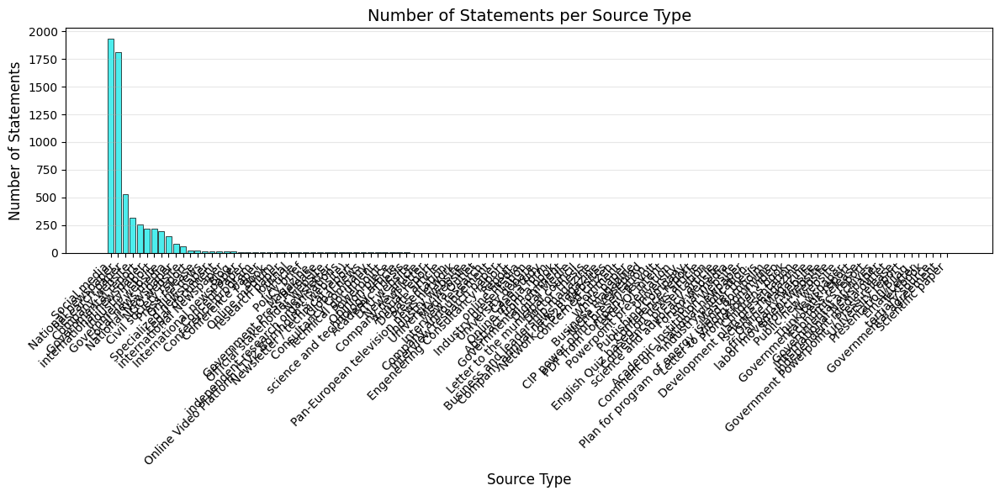

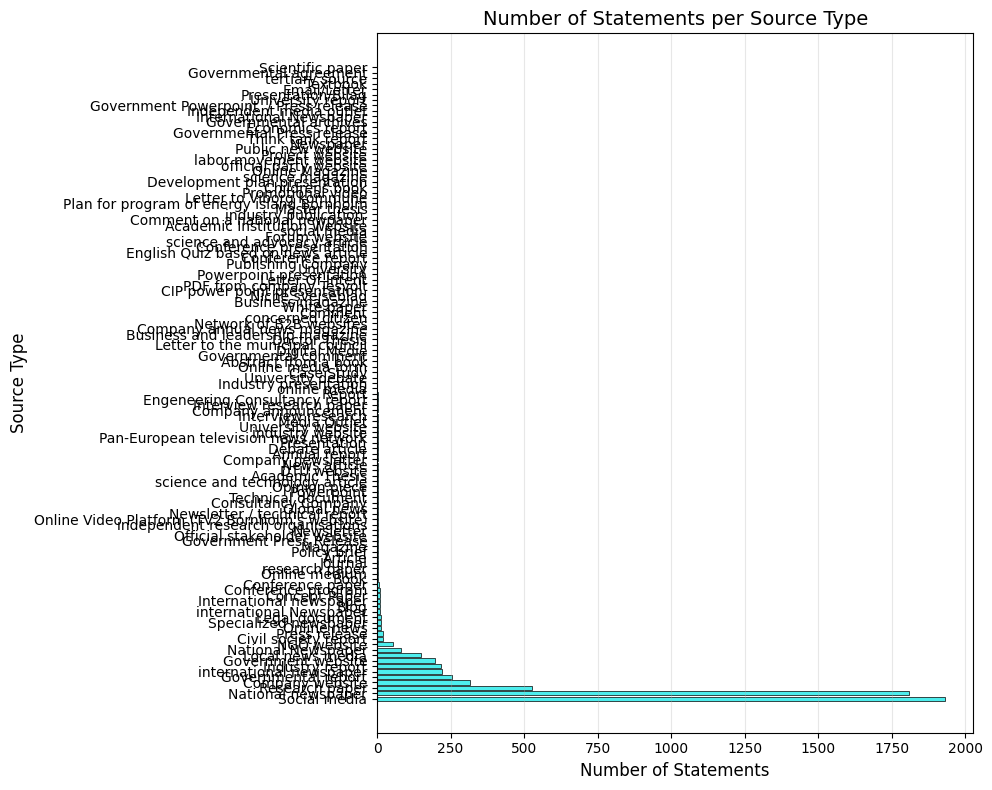

In [36]:
# Count statements per source type
source_type_counts = df['Source type'].value_counts().sort_values(ascending=False)

print("Statements per Source Type:")
print("="*60)
for source_type, count in source_type_counts.items():
    percentage = (count / len(df)) * 100
    print(f"{source_type:30s}: {count:5d} ({percentage:5.2f}%)")
print("="*60)

# Create bar chart
plt.figure(figsize=(12, 6))
plt.bar(range(len(source_type_counts)), source_type_counts.values, 
        color='#4deded', edgecolor='black', linewidth=0.5)
plt.xticks(range(len(source_type_counts)), source_type_counts.index, rotation=45, ha='right')
plt.xlabel('Source Type', fontsize=12)
plt.ylabel('Number of Statements', fontsize=12)
plt.title('Number of Statements per Source Type', fontsize=14)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Alternative: Horizontal bar chart (better for long labels)
plt.figure(figsize=(10, 8))
plt.barh(range(len(source_type_counts)), source_type_counts.values, 
         color='#4deded', edgecolor='black', linewidth=0.5)
plt.yticks(range(len(source_type_counts)), source_type_counts.index)
plt.xlabel('Number of Statements', fontsize=12)
plt.ylabel('Source Type', fontsize=12)
plt.title('Number of Statements per Source Type', fontsize=14)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()


Found 16 statements from Kraka Economics mentioning Energy Agency


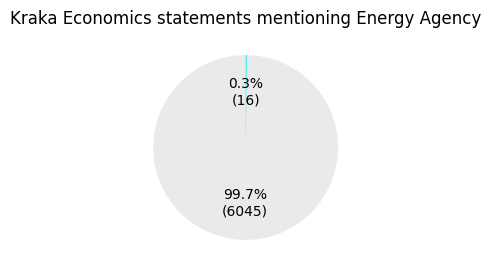

In [37]:
# Create condition for statements from Kraka Economics that mention Energy Agency
kraka_condition = df['Actor'].str.contains('Kraka', case=False, na=False)
energy_agency_mention = df['Statement'].str.contains('Energy Agency', case=False, na=False)
combined_condition = kraka_condition & energy_agency_mention

# Count the results
kraka_ea_count = combined_condition.sum()
print(f"Found {kraka_ea_count} statements from Kraka Economics mentioning Energy Agency")

# Visualize using the defined function
visualize(combined_condition, 'Kraka Economics statements mentioning Energy Agency')


Found 16 statements from Kraka Economics mentioning Energy Agency



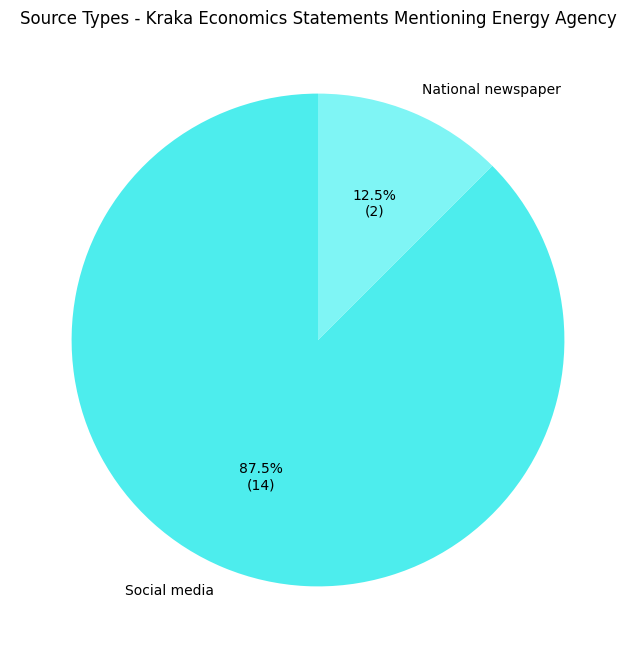


Breakdown by Source Type:
Social media                  :    14 (87.50%)
National newspaper            :     2 (12.50%)


In [38]:
# Filter for statements from Kraka Economics that mention Energy Agency
kraka_condition = df['Actor'].str.contains('Kraka', case=False, na=False)
energy_agency_mention = df['Statement'].str.contains('Energy Agency', case=False, na=False)
combined_condition = kraka_condition & energy_agency_mention

kraka_ea_df = df[combined_condition].copy()

print(f"Found {len(kraka_ea_df)} statements from Kraka Economics mentioning Energy Agency\n")

# Count statements per source type for this filtered set
source_type_counts = kraka_ea_df['Source type'].value_counts()

# Create a pie chart
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{p:.1f}%\n({v:d})'.format(p=pct,v=val)
    return my_autopct

# Define colors - use teal for largest, lighter colors for others
colors = ['#4deded', '#7FF5F5', '#A6F9F9', '#CCF9F9', '#E6FCFC']

plt.figure(figsize=(8, 8))
plt.pie(source_type_counts, labels=source_type_counts.index, autopct=make_autopct(source_type_counts), 
        colors=colors[:len(source_type_counts)], startangle=90)
plt.title('Source Types - Kraka Economics Statements Mentioning Energy Agency')
plt.show()

# Print summary
print("\nBreakdown by Source Type:")
print("="*60)
for source_type, count in source_type_counts.items():
    percentage = (count / len(kraka_ea_df)) * 100
    print(f"{source_type:30s}: {count:5d} ({percentage:5.2f}%)")
